# Задание 1

In [ ]:
%cd /content/drive/MyDrive/Github/digital_image_processing

/content/drive/MyDrive/Github/digital_image_processing


In [ ]:
from sklearn.cluster import KMeans
import cv2
import numpy as np
import imutils
import matplotlib.pyplot as plt

In [ ]:
img = cv2.imread('./praktika2/Image2.3/image.jpeg') # Вводим исходное изображение

print("Img's shape: ", img.shape) # Выводим параметры начального изображения

Img's shape:  (827, 1470, 3)


In [ ]:
img_r = (img / 255.0).reshape(-1,3) # Нормализуем изображение

print("New shape (img_r): ", img_r.shape) # Выводим параметры нормализованного изображения

New shape (img_r):  (1215690, 3)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


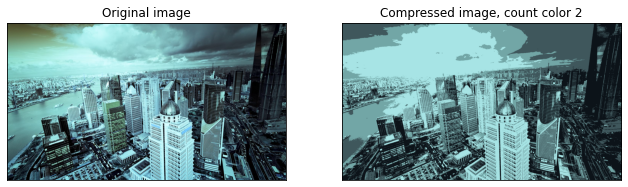

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


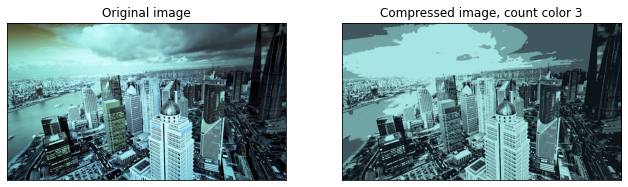

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


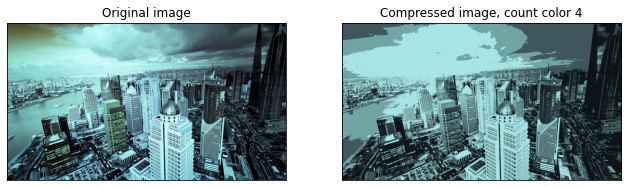

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


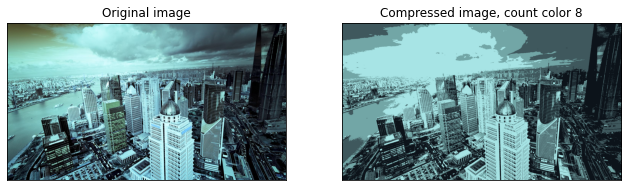

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


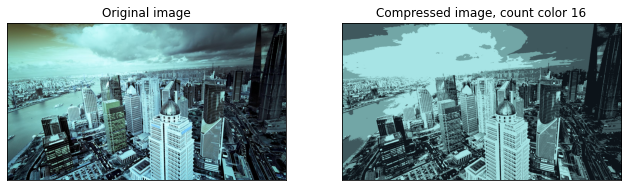

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


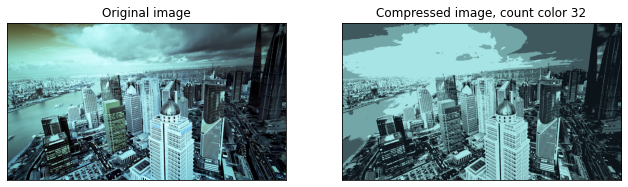

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


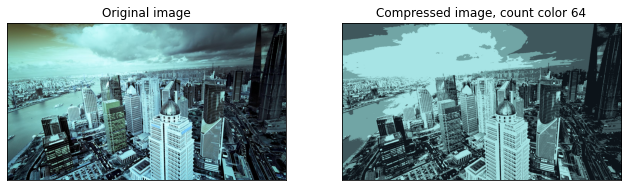

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


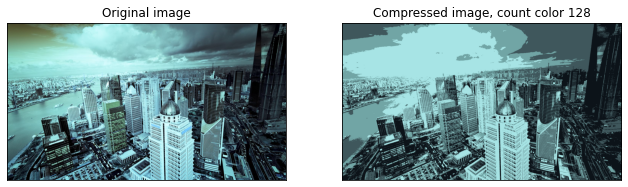

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Compressed image's shape:  (827, 1470, 3)


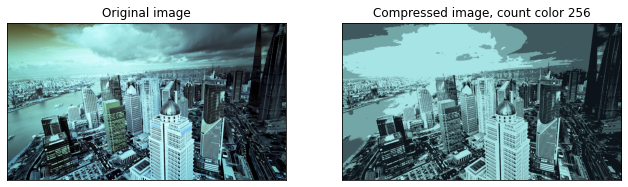

In [ ]:
count = [2, 3, 4, 8, 16, 32, 64, 128, 256]
for i in count:
  k_colors = KMeans(n_clusters=4).fit(img_r)
  # Устанавливаем необходимое количество цветов 
  # и запускаем процесс обучения (кластеризации пикселей по 
  # группам)
  imgC = k_colors.cluster_centers_[k_colors.labels_]
  imgC = (np.reshape(imgC, (img.shape))*255).astype(np.uint8) 
  # Возвращаем изображению исходные параметры
  #print("Compressed image's shape: ", imgC.shape)
  plt.figure(figsize=(11,6))
  plt.subplot(121), plt.imshow(img),plt.title('Original image')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(imgC),plt.title(f'Compressed image, count color {i}')
  plt.xticks([]), plt.yticks([])
  plt.show()
  cv2.imwrite(f'./praktika3/Scikit_Compressor/output_count_color_{i}.jpg', imgC)

# Задание 2

--- 31.916996955871582 seconds ---


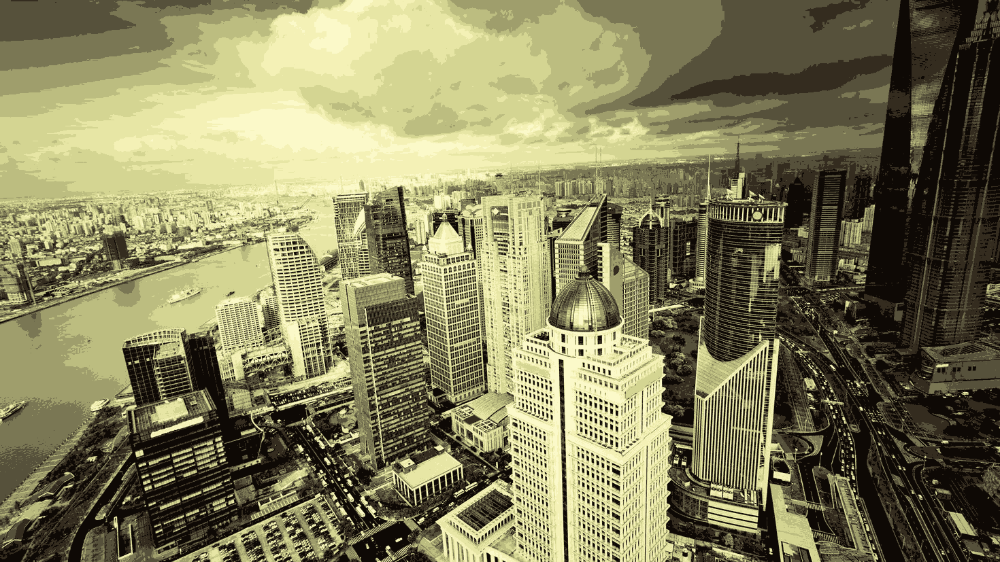

--- 48.86908221244812 seconds ---


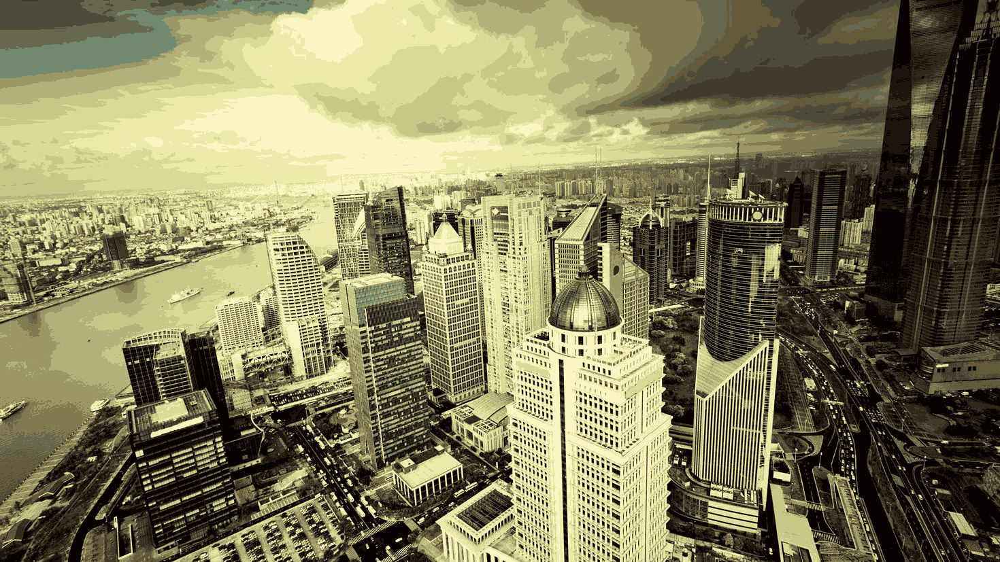

--- 68.37092137336731 seconds ---


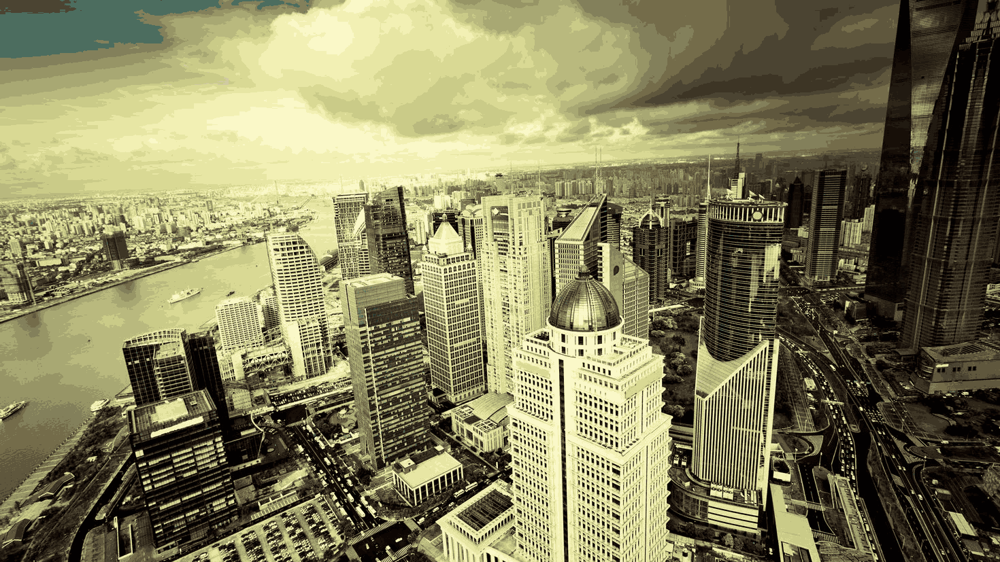

In [ ]:
import numpy as np
import matplotlib
from PIL import Image
import time

def kmeans(Input,K,Max_iters):
    
    N,D = np.shape(Input)
    R = np.random.permutation(N)
    Kvec = Input[R[0:K],:]
    Distance = np.zeros((N,K))
    
    for nn in range(0,Max_iters):
        F = np.zeros((N,K))
        for kk in range(0,K):
            Distance[:,kk] = np.sum( np.square(Input - np.tile( Kvec[kk,:], 
                                     (N,1)),dtype=np.float64),axis=1 )
        Dmin = Distance.argmin(axis=1) % Distance.shape[1]
        for mm in range(0,K):
            if np.size(Dmin[mm==Dmin]) >0:
                Kvec[mm,:] = np.mean(Input[mm==Dmin],axis=0)
        for ii in range(0,N):
            F[ii,Dmin[ii]] = 1
        error = sum(sum((F*Distance)/N))
        #print('Error = ' + str(error))
    return Kvec,Dmin


Datain = np.asarray(Image.open('./praktika2/Image2.3/image.jpeg'),dtype=np.float64)

ReshapedData = np.reshape(Datain, (np.size(Datain,0) * 
np.size(Datain,1),np.size(Datain,2)))

K_values = [10, 15, 20] # устанавливаем количество цветов
Max_iters = [15, 20, 25]
# устанавливаем количество итераций, чем больше итераций, тем 
# тщательнее будет осуществляться кластеризация и тем дольше будет работать 
# программа

for i in range(len(K_values)):
  K = K_values[i]
  iters = Max_iters[i]

  start_time = time.time()

  Kvec,Dmin = kmeans(ReshapedData,K,iters)

  print("--- %s seconds ---" % (time.time() - start_time))

  Dvec = np.zeros((len(Dmin),len(Kvec[0,:])))

  for jj in range(0,K):
      Dvec[jj==Dmin,:] = Kvec[jj,:]

  imout = np.reshape(np.uint8(Dvec), 
  (np.size(Datain,0),np.size(Datain,1),len(Kvec[0,:])))

  im = Image.fromarray(imout,'RGB')
  im.show()
  #im.save(f'./praktika3/Scikit_Compressor/output_count_color_{K}.jpeg')#, "JPEG", optimize = True

Max_iters = 20 является оптимальным. Качество города как на изображении с Max_iters = 25 и функция выполняется за 39 сек

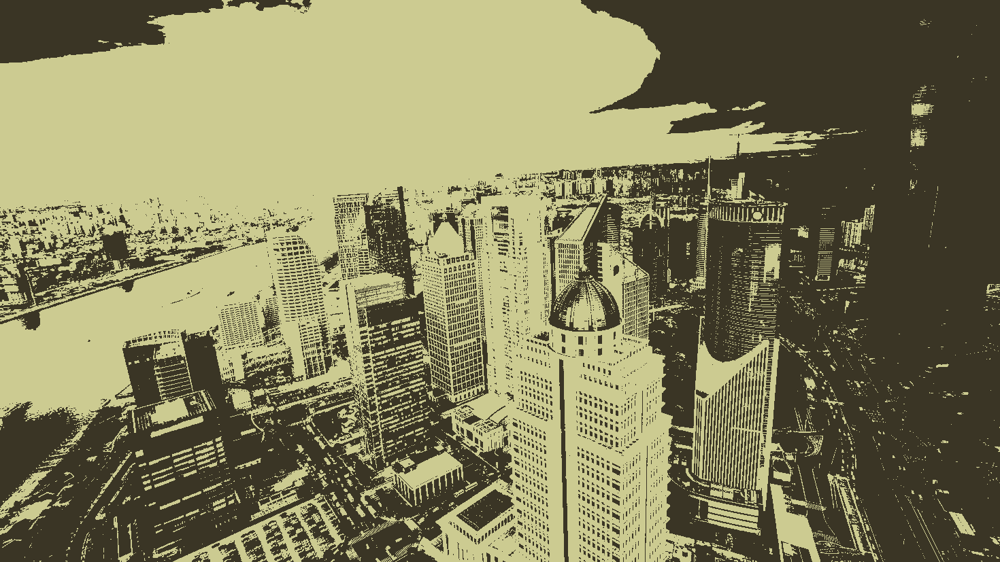

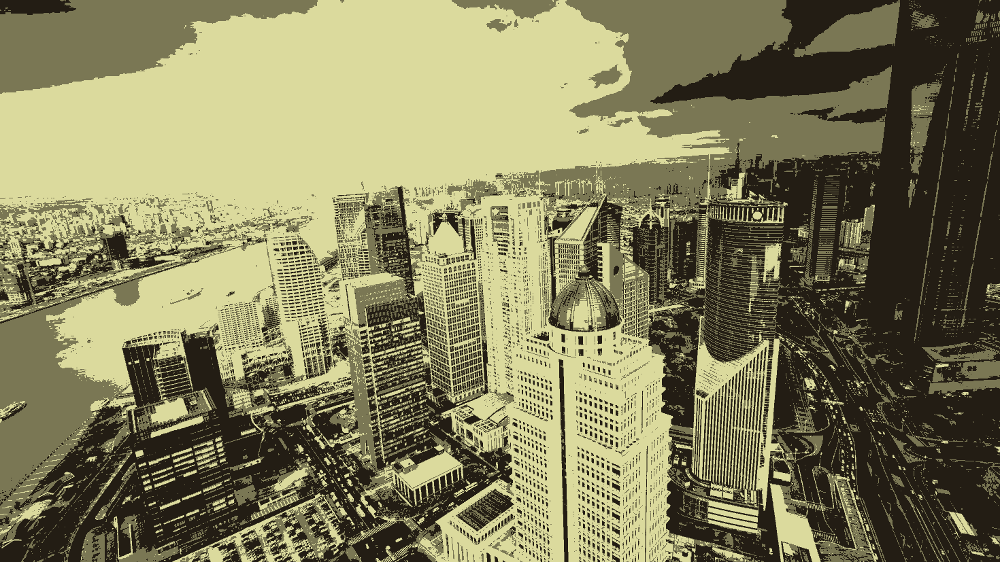

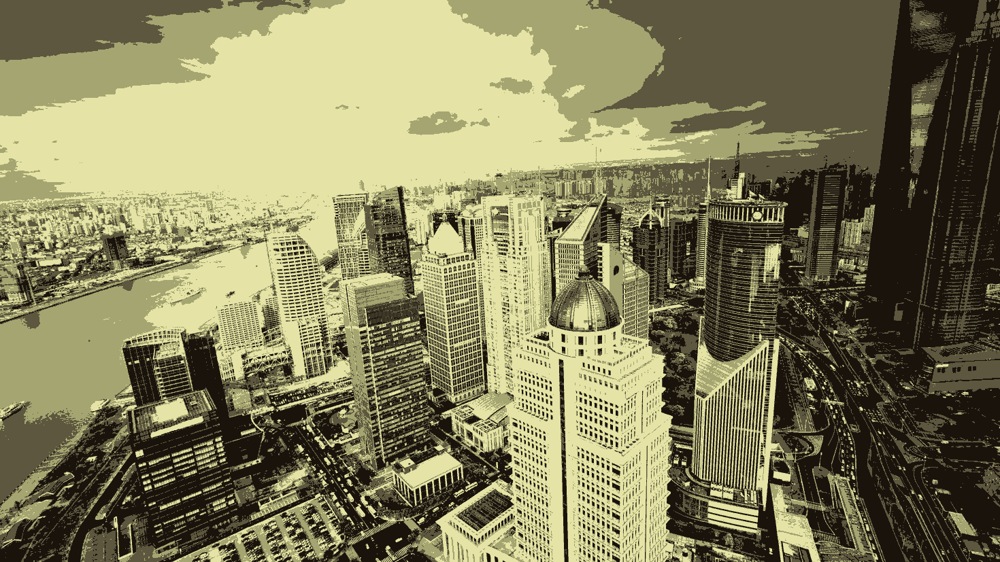

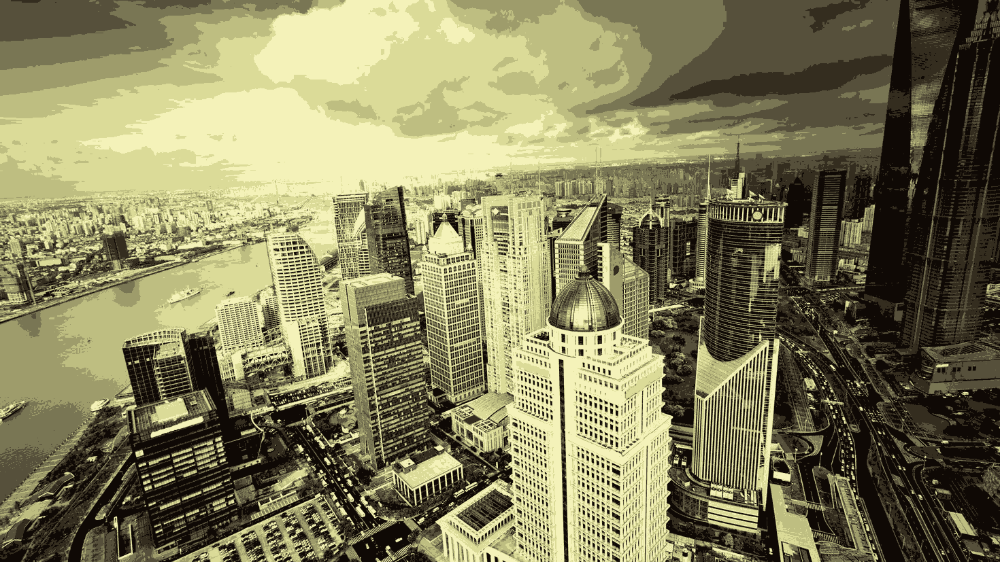

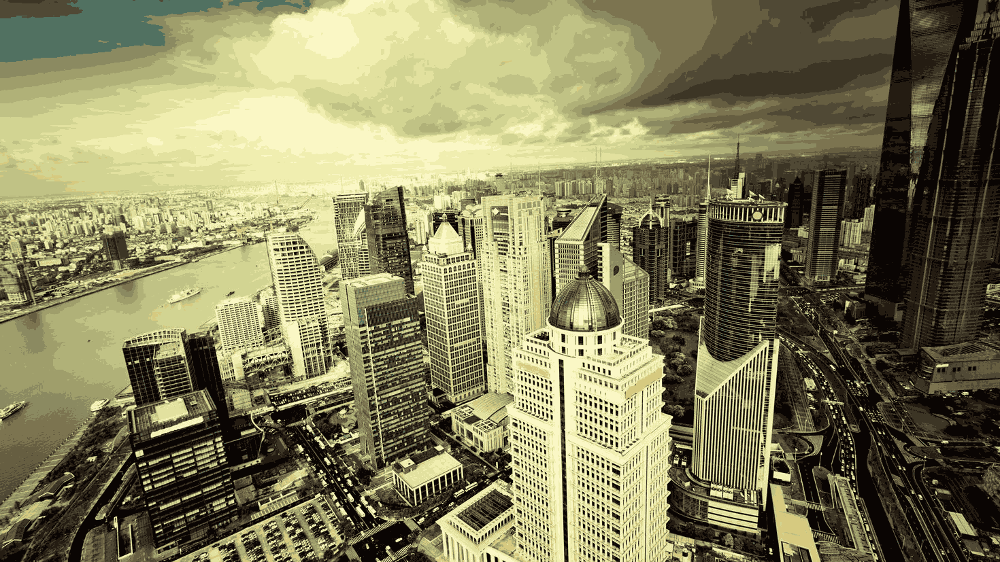

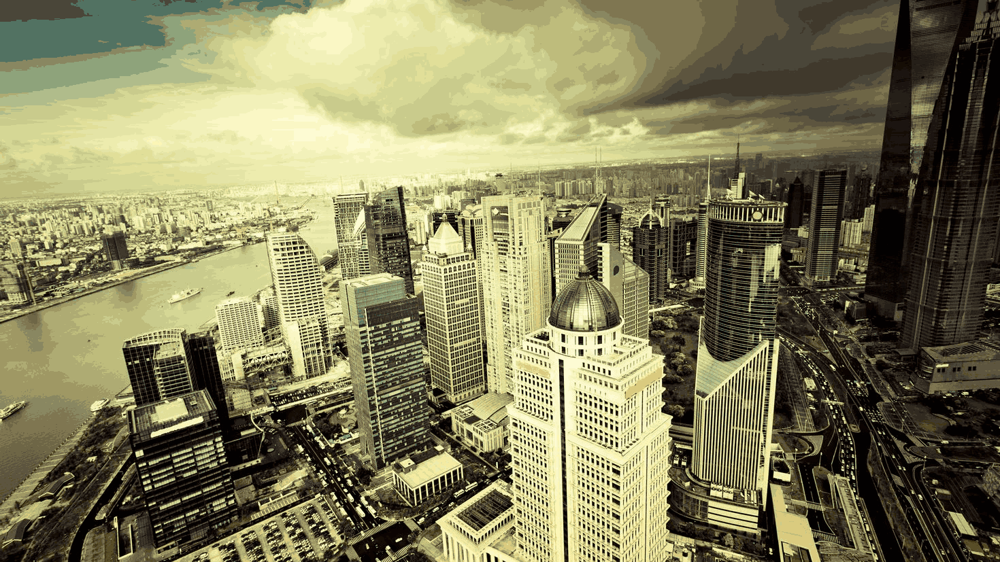

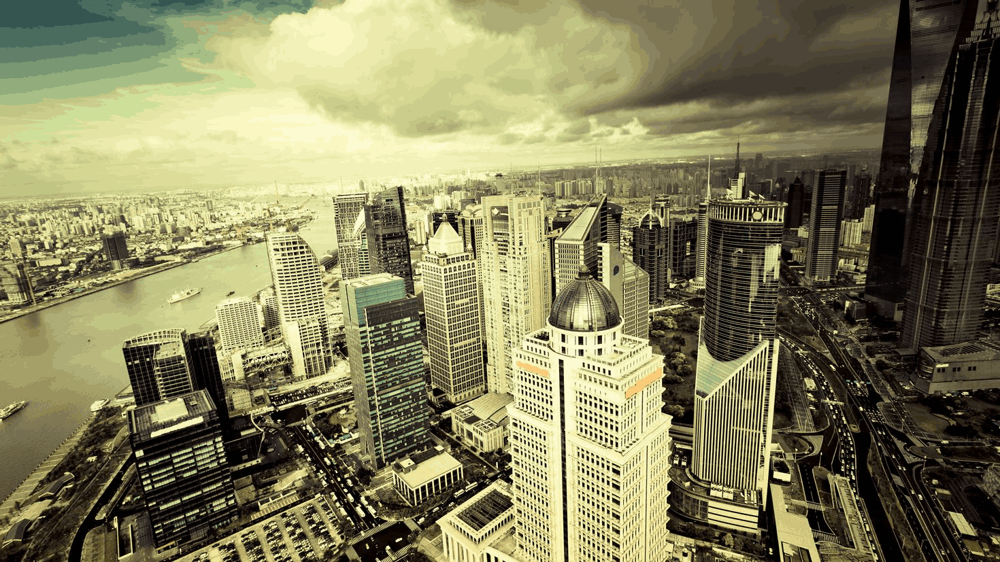

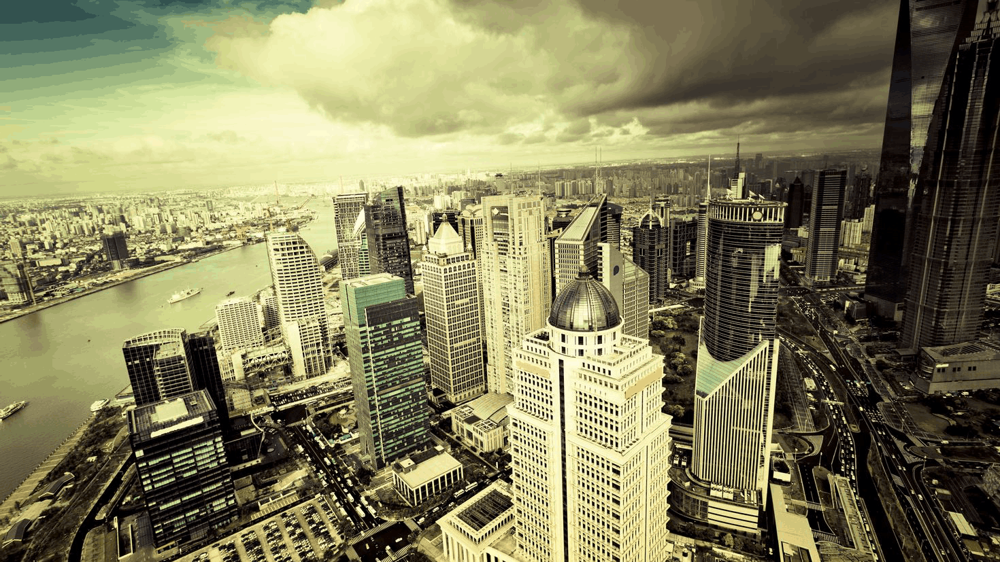

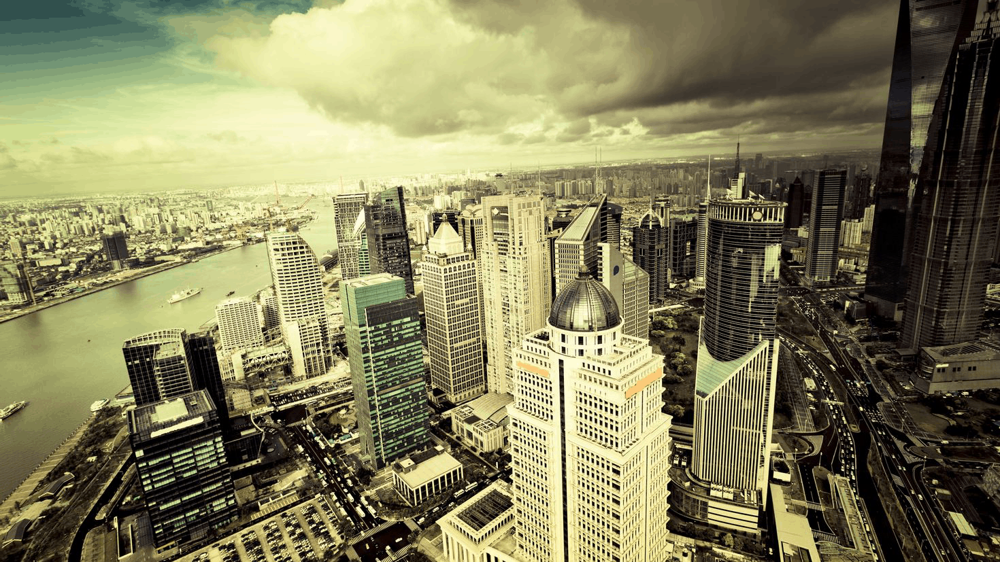

In [ ]:
K_list = [2, 3, 4, 8, 16, 32, 64, 128, 256]
for K in K_list:
  Kvec,Dmin = kmeans(ReshapedData,K,20)

  Dvec = np.zeros((len(Dmin),len(Kvec[0,:])))

  for jj in range(0,K):
      Dvec[jj==Dmin,:] = Kvec[jj,:]

  imout = np.reshape(np.uint8(Dvec), 
  (np.size(Datain,0),np.size(Datain,1),len(Kvec[0,:])))

  im = Image.fromarray(imout,'RGB')
  im.show()
  im.save(f'./praktika3/K-means Compressor/output_count_color_{K}.jpeg')#, "JPEG", optimize = True

# Задание 3

In [ ]:
import os

img = cv2.imread('./praktika2/Image2.3/image.jpeg') # Вводим исходное изображение

#print("Img's shape: ", img.shape)

img_r = (img / 255.0).reshape(-1,3) # Нормализуем изображение

#print("New shape (img_r): ", img_r.shape) # Выводим параметры нормализованного изображения
print('Scikit Compressor')
count = [2, 3, 4, 8, 16, 32, 64, 128, 256]
for i in count:
  print(f'count color {i}')
  start_time = time.time()
  k_colors = KMeans(n_clusters=i).fit(img_r)
  print("--- %s seconds ---" % (time.time() - start_time))
  # Устанавливаем необходимое количество цветов 
  # и запускаем процесс обучения (кластеризации пикселей по 
  # группам)
  imgC = k_colors.cluster_centers_[k_colors.labels_]
  imgC = (np.reshape(imgC, (img.shape))*255).astype(np.uint8) 
  # Возвращаем изображению исходные параметры
  #print("Compressed image's shape: ", imgC.shape)
  file_name = f'./praktika3/test/output_count_color_{i}.jpg'
  cv2.imwrite(file_name, imgC)
  print(os.path.getsize(file_name))
  os.remove(file_name)
  print('---------------------------')

Scikit Compressor
count color 2


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 1.9342613220214844 seconds ---
518203
---------------------------
count color 3


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 4.513124227523804 seconds ---
615607
---------------------------
count color 4


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 3.680976629257202 seconds ---
648714
---------------------------
count color 8


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 9.855868577957153 seconds ---
671356
---------------------------
count color 16


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 16.983928203582764 seconds ---
673704
---------------------------
count color 32


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 39.768412351608276 seconds ---
659228
---------------------------
count color 64


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 91.92148852348328 seconds ---
646467
---------------------------
count color 128


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 178.11466908454895 seconds ---
634000
---------------------------
count color 256


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--- 424.9812834262848 seconds ---
624717
---------------------------


In [ ]:
K_list = [2, 3, 4, 8, 16, 32, 64, 128, 256]
print('K-means Compressor')
for K in K_list:
  print(f'count color {K}')
  start_time = time.time()
  Kvec,Dmin = kmeans(ReshapedData,K,20)
  print("--- %s seconds ---" % (time.time() - start_time))
  Dvec = np.zeros((len(Dmin),len(Kvec[0,:])))

  for jj in range(0,K):
      Dvec[jj==Dmin,:] = Kvec[jj,:]

  imout = np.reshape(np.uint8(Dvec), 
  (np.size(Datain,0),np.size(Datain,1),len(Kvec[0,:])))

  im = Image.fromarray(imout,'RGB')
  file_name = f'./praktika3/test/output_count_color_{K}.jpeg'
  im.save(file_name)
  print(os.path.getsize(file_name))
  os.remove(file_name)

K-means Compressor
count color 2
--- 21.627299547195435 seconds ---
269602
count color 3
--- 23.304407835006714 seconds ---
309967
count color 4
--- 24.41278052330017 seconds ---
318715
count color 8
--- 29.07249116897583 seconds ---
316262
count color 16
--- 39.873048543930054 seconds ---
313552
count color 32
--- 58.0655837059021 seconds ---
315612
count color 64
--- 95.24100518226624 seconds ---
316383
count color 128
--- 170.9415488243103 seconds ---
316468
count color 256
--- 332.6420476436615 seconds ---
316752


См. результат в Excel файле

# Задание 4

In [1]:
from os import listdir
from os.path import isfile, join
import numpy as np
from PIL import Image
onlyfiles = [f for f in listdir('.\input_image') if isfile(join('.\input_image', f))]

path = r'C:\Users\1395003\Desktop\digital_image_processing\digital_image_processing'

data = []

for image in onlyfiles:
    Datain = np.asarray(Image.open(path + '/praktika3/input_image/' + image),dtype=np.float64)
    data.append(np.reshape(Datain, (np.size(Datain,0) * np.size(Datain,1),np.size(Datain,2))))


In [2]:
from tqdm import tqdm
def kmeans(Input,K,Max_iters):
    
    N,D = np.shape(Input)
    R = np.random.permutation(N)
    Kvec = Input[R[0:K],:]
    Distance = np.zeros((N,K))
    
    for nn in range(0,Max_iters):
        F = np.zeros((N,K))
        for kk in range(0,K):
            Distance[:,kk] = np.sum( np.square(Input - np.tile( Kvec[kk,:], 
                                     (N,1)),dtype=np.float64),axis=1 )
        Dmin = Distance.argmin(axis=1) % Distance.shape[1]
        for mm in range(0,K):
            if np.size(Dmin[mm==Dmin]) >0:
                Kvec[mm,:] = np.mean(Input[mm==Dmin],axis=0)
        for ii in range(0,N):
            F[ii,Dmin[ii]] = 1
        error = sum(sum((F*Distance)/N))
        #print('Error = ' + str(error))
    return Kvec,Dmin

#Datain = np.asarray(Image.open(path + '.\praktika2\Image2.3\image.jpeg'),dtype=np.float64)

#ReshapedData = np.reshape(Datain, (np.size(Datain,0) * 
#np.size(Datain,1),np.size(Datain,2)))

#K_values = [2]
#Max_iters = [2]
for i in range(len(data)):

  Kvec,Dmin = kmeans(data[i],400,60)

  Dvec = np.zeros((len(Dmin),len(Kvec[0,:])))

  for jj in range(0,K):
      Dvec[jj==Dmin,:] = Kvec[jj,:]

  imout = np.reshape(np.uint8(Dvec), 
  (np.size(Datain,0),np.size(Datain,1),len(Kvec[0,:])))

  im = Image.fromarray(imout,'RGB')
  im.save(f'./result5image/image{i}.jpeg')#, "JPEG", optimize = True



  0%|          | 0/5 [00:00<?, ?it/s]

При K = 400 и Max_iter = 60 сжатие происходит без наглядного ухудшения качества изображения.